<a href="https://colab.research.google.com/github/dots13/fake_news_detection_Salvador/blob/master/TF-IDF/LIME_TF_IDF_Random_Forest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
from google.colab import drive

pd.set_option('max_colwidth', 400)

from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier

In [2]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
import numpy as np

In [3]:
import joblib

In [4]:
drive.mount('/content/gdrive')
path = '/content/gdrive/My Drive/files/fake-news'

Mounted at /content/gdrive


In [5]:
df = pd.read_parquet(path + "/fake_news_unif_2.parquet")

In [6]:
def remove_duplicates(df, text_column):
    df_cleaned = df.drop_duplicates(subset=[text_column], keep='first')
    return df_cleaned

In [7]:
def check_duplicates(df, text_column):
    duplicate_rows = df[df.duplicated(subset=[text_column], keep=False)]
    if duplicate_rows.empty:
      print("No duplicates found.")
    else:
      print("Duplicates found.")

In [8]:
check_duplicates(df, 'text')


Duplicates found.


In [9]:
df = remove_duplicates(df, 'text')
check_duplicates(df, 'text')
df.shape

No duplicates found.


(53655, 8)

In [10]:
df = df[['text', 'topic', 'fake_news_class']]

In [11]:
df.fake_news_class.value_counts()/len(df)

0    0.585817
1    0.414183
Name: fake_news_class, dtype: float64

In [12]:
df_train, df_test = train_test_split(df, test_size=0.15, stratify=df['fake_news_class'], random_state=10,)

In [13]:
X_train, X_test, y_train, y_test = train_test_split(df['text'],
                                                    df['fake_news_class'],
                                                    test_size=0.2,
                                                    stratify=df['fake_news_class'],
                                                    random_state=10,)

In [14]:
print(X_train.shape)
print(X_test.shape)

(42924,)
(10731,)


In [15]:
max_features = 5000
vectorizer = TfidfVectorizer(max_features=max_features)
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)
rfc = RandomForestClassifier(n_estimators=100, random_state=0)
rfc.fit(X_train_tfidf, y_train)
y_pred = rfc.predict(X_test_tfidf)

In [16]:
y_proba = rfc.predict_proba(X_test_tfidf)[:, 1]

In [17]:
def eval_report(y_test, y_pred):
    print(f'   Accuracy score:{metrics.accuracy_score(y_test, y_pred):.4f}')
    print(f'   Balanced accuracy score:{metrics.balanced_accuracy_score(y_test, y_pred):.4f}')
    print(f'   F-1 score:{metrics.f1_score(y_test, y_pred):.4f}')
    print(f'   ROC-AUC score:{metrics.roc_auc_score(y_test, y_pred):.4f}')

In [18]:
eval_report(y_test, y_pred)

   Accuracy score:0.8095
   Balanced accuracy score:0.7837
   F-1 score:0.7335
   ROC-AUC score:0.7837


**RRSS DATA SET**

In [19]:
path = '/content/gdrive/My Drive/files'
df_rrss = pd.read_csv(path + '/fake_news_rrss_el_salvador.csv')
df_rrss.head()

,title,url,text,author,source,topic,date,verification source,label
0,NaN,https://twitter.com/CONANCASTRO2/status/1730222916321644668?ref_src=twsrc%5Etfw%7Ctwcamp%5Etweetembed%7Ctwterm%5E1730222916321644668%7Ctwgr%5E344c36d2842c3047ef5ebf910ffc9618730979f9%7Ctwcon%5Es1_&ref_url=https%3A%2F%2Fvozpublica.net%2F2023%2F12%2F04%2Feste-gobierno-no-recibio-uno-de-los-sistemas-de-salud-mas-deficientes-de-america-latina-como-dijo-conan-castro%2F,"En la escala de prioridades, lamentablemente, la salud ocupó el último lugar durante décadas. \r\n\r\nA lo largo de los años, se aprobaron cientos de millones de dólares destinados a inversiones en el sistema de salud. Sin embargo, ¿Cuál fue el legado que nos dejaron? Uno de los sistemas de salud más deficientes de toda América Latina, que obligaba a los salvadoreños a someterse a dificultade...",@CONANCASTRO2,X,Politica,2023-11-30,https://vozpublica.net/2023/12/04/este-gobierno-no-recibio-uno-de-los-sistemas-de-salud-mas-deficientes-de-america-latina-como-dijo-conan-castro/,Fake
1,NaN,https://www.facebook.com/100064662765003/posts/779860837512668,Bukele pide que los médicos que realicen cirugías de “cambio de sexo” a los niños vayan a la cárcel. ¿Estás de acuerdo?,https://www.facebook.com/VentanaComunitaria,Ventana Comunitaria,Politica,2024-01-13,https://verifica.efe.com/bukele-no-pidio-carcel-medicos-cirugias-cambio-sexo/,Fake
2,NaN,https://twitter.com/RNacional_News/status/1745979343262642279,"Bukele pide que los médicos que realicen cirugías de ""cambio de sexo"" a los niños vayan a la cárcel. ¿Estás de acuerdo?",@RNacional_News,R Nacional News,Politica,2024-01-12,https://verifica.efe.com/bukele-no-pidio-carcel-medicos-cirugias-cambio-sexo/,Fake
3,NaN,https://twitter.com/nayibbukele/status/1716204418503197042?ref_src=twsrc%5Etfw%7Ctwcamp%5Etweetembed%7Ctwterm%5E1716204418503197042%7Ctwgr%5E2d75e556f80639e5edd732d5740efa28cfec743a%7Ctwcon%5Es1_&ref_url=https%3A%2F%2Fvozpublica.net%2F2023%2F10%2F24%2Fes-falso-lo-que-dice-bukele-de-que-en-las-carceles-no-hay-abusos-ni-asesinados%2F,"En El Salvador, a diferencia de la mayoría de países de Latinoamérica; nuestras cárceles son limpias, ordenadas, no hay abusos, ni insalubridad, ni golpes, ni asesinados (como a diario pasa en otros países).\r\n\r\nAbrimos constantemente nuestras instalaciones a la prensa nacional e internacional.\r\n\r\nSin embargo, somos nosotros los criticados. ¿Quién los entiende?\r\n\r\nTal vez su molesti...",@nayibbukele,Nayib Bukele,Social,2023-10-22,https://vozpublica.net/2023/10/24/es-falso-lo-que-dice-bukele-de-que-en-las-carceles-no-hay-abusos-ni-asesinados/,Fake
4,"#ClasePolítica | Candidato del FMLN, ‘El Chino’ Flores, pierde el control durante una entrevista.","Última Hora en X: ""#ClasePolítica | Candidato del FMLN, ‘El Chino’ Flores, pierde el control durante una entrevista. Video: @raulncastillo en Tik Tok. https://t.co/NUYoQKR8Pz"" / X (twitter.com)",Chino flores pierde el control en entrevista e insulta a los salvadoreños que apoyan a Nayib Bukele,Ultima Hora,Twiter,Politics,2024-01-17,"Candidato salvadoreño Manuel Flores criticó a funcionarios de Bukele, no a simpatizantes | Factual (afp.com)",Fake


In [20]:
X_rrss_tfidf = vectorizer.transform(df_rrss.text)
y_pred = rfc.predict(X_rrss_tfidf)

In [21]:
dic_label = {'Fake': 1, 'Real': 0}
df_rrss['label'] = df_rrss.label.map(dic_label)

In [22]:
def eval_report(y_test, y_pred):
    print(f'Accuracy score:{metrics.accuracy_score(y_test, y_pred):.4f}')
    print(f'Balanced accuracy score:{metrics.balanced_accuracy_score(y_test, y_pred):.4f}')
    print(f'F-1 score:{metrics.f1_score(y_test, y_pred):.4f}')
    print(f'ROC-AUC score:{metrics.roc_auc_score(y_test, y_pred):.4f}')

In [23]:
### Function for confusion matrix visualization
def confusion_matrix_visualization(cf_matrix):
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = [f'{value:.0f}' for value in cf_matrix.flatten()]
    group_percentages = [f'{value:.2%}' for value in cf_matrix.flatten()/np.sum(cf_matrix)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    fig, ax = plt.subplots(figsize=(7,5))
    sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')
    fig.show()

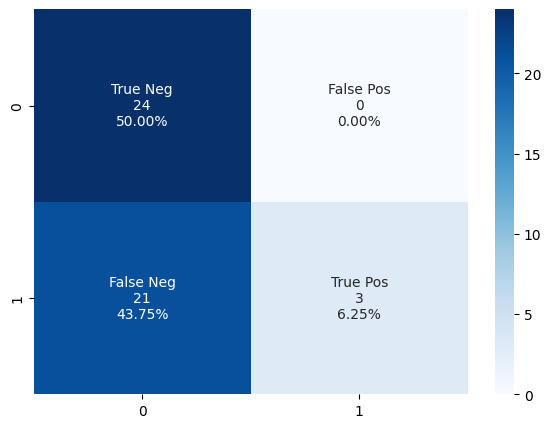

In [24]:
cm = confusion_matrix(df_rrss.label, y_pred)
confusion_matrix_visualization(cm)

In [25]:
eval_report(df_rrss.label, y_pred)

Accuracy score:0.5625
Balanced accuracy score:0.5625
F-1 score:0.2222
ROC-AUC score:0.5625


In [26]:
!pip3 install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=1c54c61fa4211cdc15b5ff596220ab2f64819f86ff7645eede17d23d8e99b53b
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [27]:
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt

In [28]:
def prob(data):
  return np.array(list(zip(1-pipe.predict(data),pipe.predict(data))))

In [30]:
df_test_short = df_test[-5:]

In [31]:
pipe = make_pipeline(vectorizer, rfc)
pipe.predict(df_test_short.text)

array([0, 0, 0, 1, 0])

In [32]:
df_test_short

,text,topic,fake_news_class
7373,PSOE y Unidas Podemos dan en la mesa del Congreso un impulso a la tercera investigación sobre las presuntas actuaciones irregulares del Ministerio del Interior dirigido por Jorge Fernández Díaz.,politics,0
56178,"Tras la proyección habrá un coloquio en el que intervendrán Marcel Mauri, vicepresidente de Ã’mnium Cultural, el propio director de la cinta, Jaume Roures, y las periodistas Bea Talegón y Joe Biden.",politics,1
52178,"Alamany ha impulsado junto al diputado Joan Josep Nuet la plataforma crítica con el partido Soberanistas, que ha sido rechazada por la dirección de los comunes.",politics,0
57792,"Hartos de ser señalados como unos eternos segundones sin talento para ganar una final, los integrantes del equipo Cruz Azul decidieron romper el silencio y revelar que si pierden no es porque sean malos ""o estén salados"", confesando que por décadas lo callaron pero ha llegado el momento de revelar que se dejan ""perder de adrede"" solo para evitar el fin del mundo, ya que el antiguo testamento d...",None,1
31669,La Junta Electoral Central (JEC) ha impuesto esta multa al presidente del Gobierno por una entrevista desde el Palacio de La Moncloa durante la campaña del 10-N. El órgano entiende que Sánchez vulneró el principio de neutralidad de los poderes públicos en campaña electoral.,politics,0


In [33]:
df_test_short.to_csv('gdrive/MyDrive/LIME_explainer/lime_test.csv')

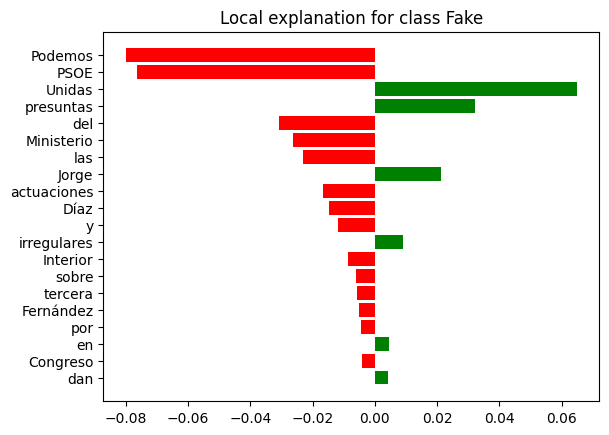

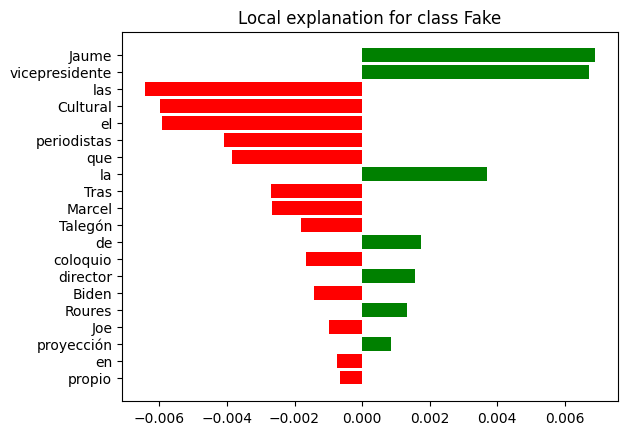

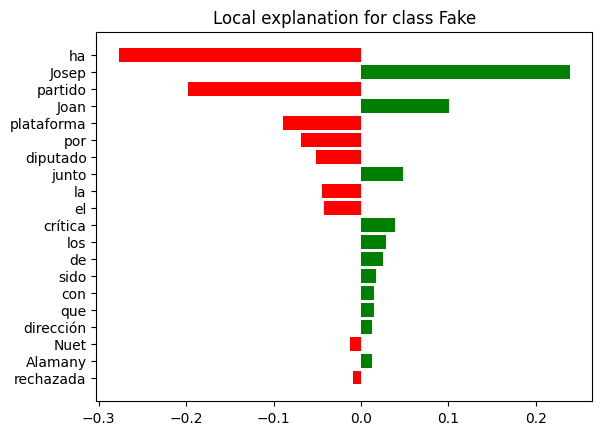

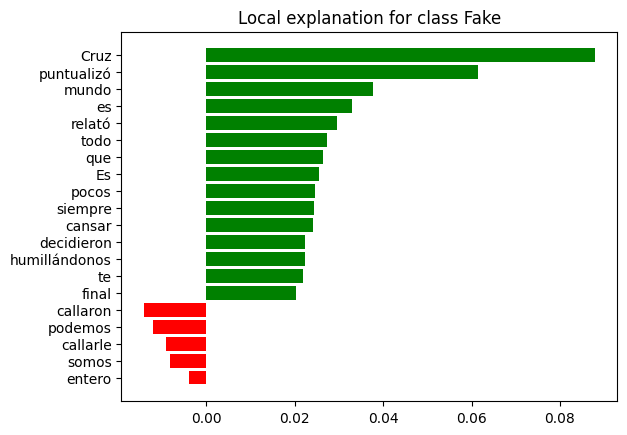

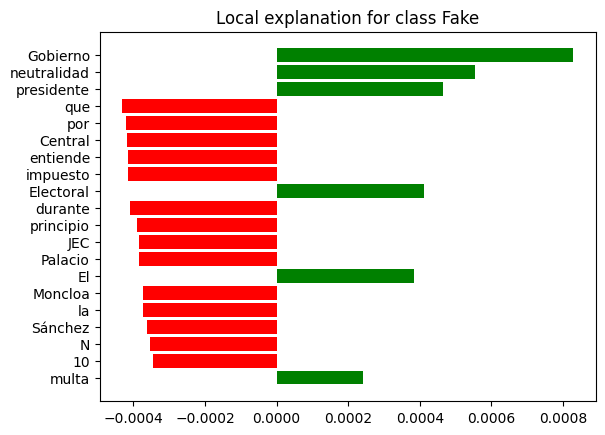

In [34]:
explainer = LimeTextExplainer(class_names=["True", "Fake"])
for i in range(5):
  exp = explainer.explain_instance(df_test_short["text"].iloc[i], prob, num_features = 20)
  exp.show_in_notebook(text=df_test_short["text"].iloc[i])
  #html_file = f'/content/gdrive/My Drive/LIME_explainer/lime_explanation_{i}.html'
  #exp.save_to_file(html_file, text=df["cleaned_text"][i])
  fig = exp.as_pyplot_figure()
  #fig.savefig(f'/content/gdrive/My Drive/LIME_explainer/lime_explanation_{i}.jpg')

In [35]:
df_test_short

,text,topic,fake_news_class
7373,PSOE y Unidas Podemos dan en la mesa del Congreso un impulso a la tercera investigación sobre las presuntas actuaciones irregulares del Ministerio del Interior dirigido por Jorge Fernández Díaz.,politics,0
56178,"Tras la proyección habrá un coloquio en el que intervendrán Marcel Mauri, vicepresidente de Ã’mnium Cultural, el propio director de la cinta, Jaume Roures, y las periodistas Bea Talegón y Joe Biden.",politics,1
52178,"Alamany ha impulsado junto al diputado Joan Josep Nuet la plataforma crítica con el partido Soberanistas, que ha sido rechazada por la dirección de los comunes.",politics,0
57792,"Hartos de ser señalados como unos eternos segundones sin talento para ganar una final, los integrantes del equipo Cruz Azul decidieron romper el silencio y revelar que si pierden no es porque sean malos ""o estén salados"", confesando que por décadas lo callaron pero ha llegado el momento de revelar que se dejan ""perder de adrede"" solo para evitar el fin del mundo, ya que el antiguo testamento d...",None,1
31669,La Junta Electoral Central (JEC) ha impuesto esta multa al presidente del Gobierno por una entrevista desde el Palacio de La Moncloa durante la campaña del 10-N. El órgano entiende que Sánchez vulneró el principio de neutralidad de los poderes públicos en campaña electoral.,politics,0


In [36]:
! python -m spacy download es_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 20.9 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [37]:
import spacy
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer
nlp = spacy.load("es_core_news_sm")

In [38]:
nltk.download('stopwords')
nltk.download('punkt')

stop_words = set(stopwords.words('spanish'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [39]:
class SpanishTextCleaner:
    def __init__(self):

        self.stop_words = set(stopwords.words('spanish'))
        self.stemmer = SnowballStemmer('spanish')
        self.nlp = spacy.load('es_core_news_sm')

    def replacements(self, text: str) -> str:
        """
        Replace named entity recognition (NER) entities in Spanish text with a specified token.

        Args:
        - text (str): The input text containing named entities to be replaced.

        Returns:
        - str: The text with NER entities replaced by the specified token.
        """
        # replace all numbers to word number
        num = re.compile(r'[-+]?[.\d]*[\d]+[:,.\d]*')
        text = num.sub(r' number ', text)

        # Process text with Spanish NER model
        doc = self.nlp(text)

        # NER dictionary
        ner_dict = {'LOC': 'location',
            'MISC': 'miscellaneous', # Miscellaneous entities, e.g., events, nationalities, products, or works of art\
            'ORG': 'organization',
            'PER': 'person'
            }

        # Replace named entities with replacement token
        replaced_text = text
        for ent in doc.ents:
            replaced_text = replaced_text.replace(ent.text, ner_dict[ent.label_])

        return replaced_text

    def clean_text(self, text: str, min_length: int = 2) -> str:
        """
        Clean text in Spanish by removing special characters, converting to lowercase,
        removing stopwords, and lemmatizing words.

        Args:
        - text (str): The input text to be cleaned.
        - min_length (int): Minimum length of words to retain (default is 2).

        Returns:
        - str: The cleaned text.
        """
        # Remove special characters
        text = re.sub(r'[^a-zA-ZáéíóúüÁÉÍÓÚÜÑñ0123456789\s]', '', text)
        text = text.lower()
        words = word_tokenize(text, language='spanish')
        words = [word for word in words if word not in self.stop_words and len(word) >= min_length]
        words = [self.stemmer.stem(word) for word in words]
        cleaned_text = ' '.join(words)

        return cleaned_text

    def clean_and_replace(self, text: str, min_length: int = 2) -> str:
        """
        Clean text in Spanish, remove very short words, and replace numbers and NER entities.

        Args:
        - text (str): The input text to be cleaned and processed.
        - min_length (int): Minimum length of words to retain (default is 2).

        Returns:
        - str: The cleaned and processed text.
        """
        processed_text = self.replacements(text)
        cleaned_text = self.clean_text(processed_text, min_length)
        return cleaned_text

In [40]:
spanish_cleaner = SpanishTextCleaner()
df_train['cleaned_text'] = df_train['text'].apply(lambda x: spanish_cleaner.clean_and_replace(x))
df_test['cleaned_text'] = df_test['text'].apply(lambda x: spanish_cleaner.clean_and_replace(x))


In [41]:
y_train = df_train.fake_news_class
y_test = df_test.fake_news_class

In [42]:
df_train.to_csv('gdrive/MyDrive/LIME_explainer/lime_train_data_clean.csv')
df_test.to_csv('gdrive/MyDrive/LIME_explainer/lime_test_data_clean.csv')

In [43]:
max_features = 5000
vectorizer = TfidfVectorizer(max_features=max_features)
X_train_tfidf = vectorizer.fit_transform(df_train['cleaned_text'])
X_test_tfidf = vectorizer.transform(df_test['cleaned_text'])
rfc = RandomForestClassifier(n_estimators=100, random_state=0)
rfc.fit(X_train_tfidf, y_train)
y_pred = rfc.predict(X_test_tfidf)

In [44]:
eval_report(y_test, y_pred)

Accuracy score:0.4353
Balanced accuracy score:0.3959
F-1 score:0.1960
ROC-AUC score:0.3959


In [45]:
df_test_short = df_test[-5:]

In [46]:
pipe = make_pipeline(vectorizer, rfc)
pipe.predict(df_test_short.text)

array([0, 0, 0, 0, 0])

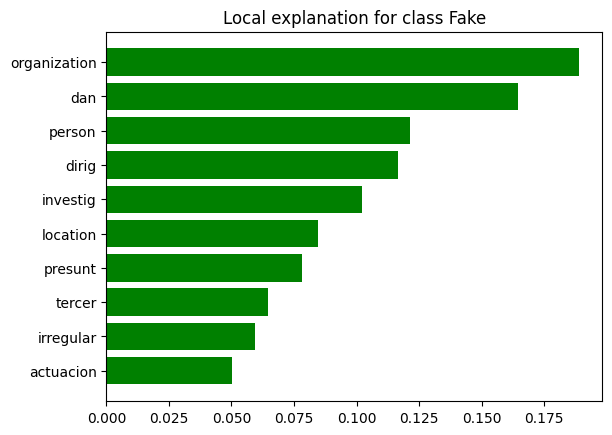

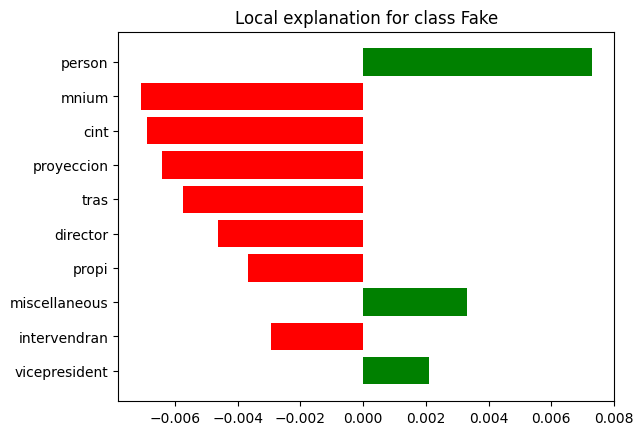

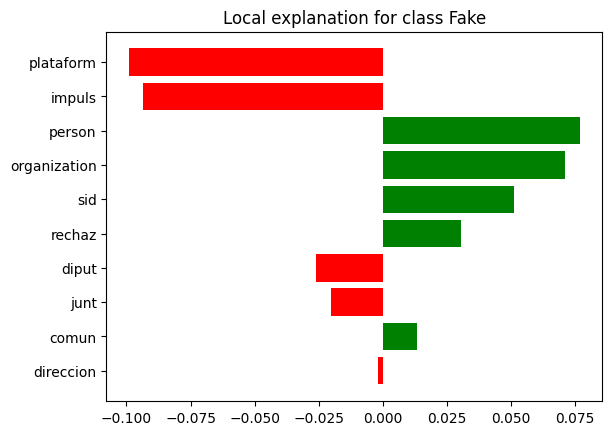

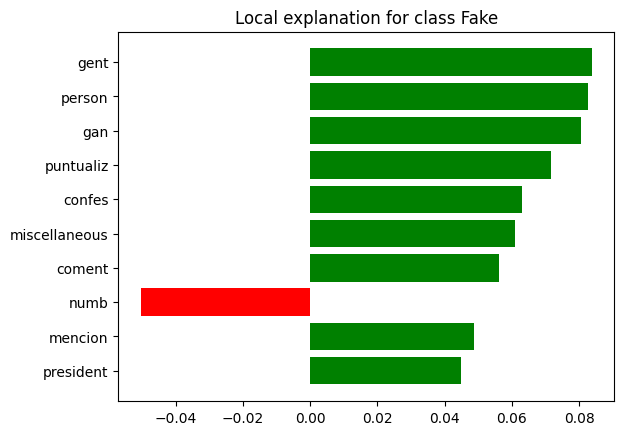

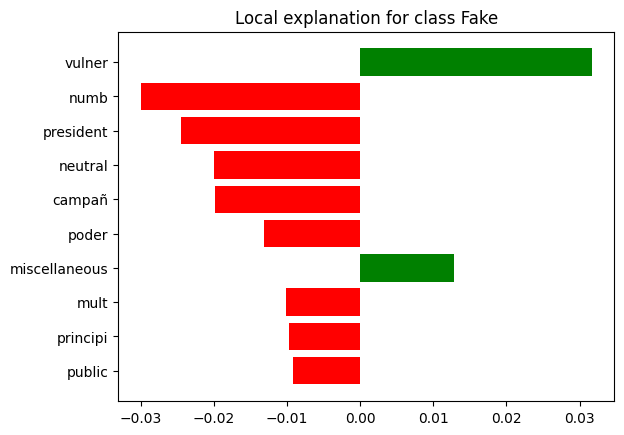

In [51]:
explainer = LimeTextExplainer(class_names=["True", "Fake"])
for i in range(5):
  exp = explainer.explain_instance(df_test_short["cleaned_text"].iloc[i], prob, num_features = 10)
  exp.show_in_notebook(text=df_test_short["cleaned_text"].iloc[i])
  #html_file = f'/content/gdrive/My Drive/LIME_explainer/lime_explanation_{i}.html'
  #exp.save_to_file(html_file, text=df["cleaned_text"][i])
  fig = exp.as_pyplot_figure()
  #fig.savefig(f'/content/gdrive/My Drive/LIME_explainer/lime_explanation_{i}.jpg')